In [1]:
import os
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import matplotlib.pyplot as plt
from GraphST import GraphST
import anndata
import numpy as np

In [2]:
# Run device, by default, the package is implemented on 'cpu'. We recommend using GPU.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
# the location of R, which is necessary for mclust algorithm. Please replace it with local R installation path
os.environ['R_HOME'] = '/anaconda3/envs/GraphST/lib/R'

In [3]:
# the number of clusters
n_clusters = 7

## Reading data

In [4]:
def prepare_slices(anndata_list,slicenames):
    merged_adata = anndata.concat(anndata_list, label='data', keys=slicenames  )
    merged_adata.var_names_make_unique()
    return merged_adata

### Raw data

In [5]:
#read h5ad slices
def load_slices(data_dir, slice_names):
    slices = []
    for slice_name in slice_names:
        slice_i = sc.read_h5ad(data_dir+slice_name+'_shuffled.h5ad')

        slices.append(slice_i)
    return slices

In [6]:
data_dir = '/SABench/Data/DLPFC_shuffled/'
slice_names = ["151673","151674", "151675", "151676"]
DLPFCS_raw = load_slices(data_dir,slice_names)
adata=prepare_slices(DLPFCS_raw,slice_names)

/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
adata.obs['data']

AAACAAGTATCTCCCA-1    151673
AAACAATCTACTAGCA-1    151673
AAACACCAATAACTGC-1    151673
AAACAGAGCGACTCCT-1    151673
AAACAGCTTTCAGAAG-1    151673
                       ...  
TTGTTGTGTGTCAAGA-1    151676
TTGTTTCACATCCAGG-1    151676
TTGTTTCATTAGTCTA-1    151676
TTGTTTCCATACAACT-1    151676
TTGTTTGTGTAAATTC-1    151676
Name: data, Length: 14243, dtype: category
Categories (4, object): ['151673', '151674', '151675', '151676']

/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


Text(0.5, 1.0, 'Raw data')

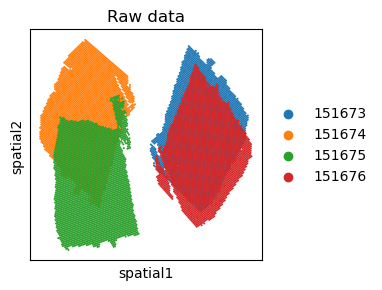

In [8]:
plt.rcParams["figure.figsize"] = (3, 3)
ax = sc.pl.embedding(adata, basis='spatial',
                color='data',
                show=False)
ax.set_title('Raw data')
#ax.axis('off')

### alignment results

In [9]:
import re
def load_results(data_dir,pattern):
    slices = []
    files = []
    for filename in os.listdir(data_dir):
        if pattern in filename :
            files.append(filename)
    files.sort(key=lambda x: int(re.search(r'_(\d+)\.h5ad', x).group(1)))
   
    for filename in files:
        file_path = os.path.join(data_dir, filename)
        adata = sc.read_h5ad(file_path)
        slices.append(adata)
 
    return slices

In [10]:
PASTE_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/PASTE_DLPFCS/','.h5ad'),slice_names)
PASTE_p0_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/PASTE_p0_DLPFCS/','.h5ad'),slice_names)
PASTE2_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/PASTE2_DLPFCS/','.h5ad'),slice_names)
STAligner_DLPFCS_landmark0=prepare_slices(load_results('/SABench/AlignmentResults/STAligner_DLPFCS/','landmark0'),slice_names)
STAligner_DLPFCS_landmark1=prepare_slices(load_results('/SABench/AlignmentResults/STAligner_DLPFCS/','landmark1'),slice_names)
STAligner_DLPFCS_landmark2=prepare_slices(load_results('/SABench/AlignmentResults/STAligner_DLPFCS/','landmark2'),slice_names)
STAligner_DLPFCS_landmark3=prepare_slices(load_results('/SABench/AlignmentResults/STAligner_DLPFCS/','landmark3'),slice_names)
SLAT_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/SLAT_DLPFCS/','.h5ad'),slice_names)
STalign_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/STalign_DLPFCS/','.h5ad'),slice_names)
CAST_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/CAST_DLPFCS/','.h5ad'),slice_names)
STAIR_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/STAIR_DLPFCS/','.h5ad'),slice_names)
SPACEL_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/SPACEL_DLPFCS/','.h5ad'),slice_names)
Spateo_rigid_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/Spateo_rigid_DLPFCS/','.h5ad'),slice_names)
Spateo_nonrigid_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/Spateo_nonrigid_DLPFCS/','.h5ad'),slice_names)
SANTO_DLPFCS=prepare_slices(load_results('/SABench/AlignmentResults/SANTO_DLPFCS/','.h5ad'),slice_names)

/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:18

In [11]:
groups=[adata,PASTE_DLPFCS,PASTE_p0_DLPFCS,PASTE2_DLPFCS,STAligner_DLPFCS_landmark0,STAligner_DLPFCS_landmark1,STAligner_DLPFCS_landmark2,STAligner_DLPFCS_landmark3,SLAT_DLPFCS,STalign_DLPFCS,CAST_DLPFCS,STAIR_DLPFCS,SPACEL_DLPFCS,Spateo_rigid_DLPFCS,Spateo_nonrigid_DLPFCS,SANTO_DLPFCS]
groups_names=['RAW_DLPFCS','PASTE_DLPFCS','PASTE_p0_DLPFCS','PASTE2_DLPFCS','STAligner_DLPFCS_landmark0','STAligner_DLPFCS_landmark1','STAligner_DLPFCS_landmark2','STAligner_DLPFCS_landmark3','SLAT_DLPFCS','STalign_DLPFCS','CAST_DLPFCS','STAIR_DLPFCS','SPACEL_DLPFCS','Spateo_rigid_DLPFCS','Spateo_nonrigid_DLPFCS','SANTO_DLPFCS']

/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


Text(0.5, 1.0, 'SLAT_DLPFCS')

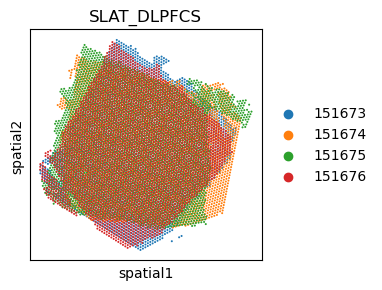

In [12]:
plt.rcParams["figure.figsize"] = (3, 3)
ax = sc.pl.embedding(SLAT_DLPFCS, basis='spatial',
                color='data',
                show=False)
ax.set_title('SLAT_DLPFCS')

## Run GraphST

In [13]:
def RunGraphST(raw_adata,idx):
    adata =raw_adata.copy()
    # define model
    model = GraphST.GraphST(adata, device=device)
    # run model
    adata = model.train()

    # clustering
    from GraphST.utils import clustering
    tool = 'mclust' # mclust, leiden, and louvain

    if tool == 'mclust':
        clustering(adata, n_clusters, method=tool) 
    elif tool in ['leiden', 'louvain']:
        clustering(adata, n_clusters, method=tool, start=0.1, end=2.0, increment=0.01)

    adata.obs["domain"] = adata.obs["domain"].astype(int)-1
    adata.obs["domain"] = pd.Categorical(adata.obs["domain"])
  
    adata_section1 = adata[adata.obs['data']=='151673', :]
    adata_section2 = adata[adata.obs['data']=='151674', :]
    adata_section3 = adata[adata.obs['data']=='151675', :]
    adata_section4 = adata[adata.obs['data']=='151676', :]
    results=[adata_section1,adata_section2,adata_section3,adata_section4]
    #Compute ARI & Visualization
    ARI_list=[]
    NMI_list=[]
    HOM_list=[]
    COM_list=[]
    for i, adata_st_i in enumerate(results):
        
        print("Slice {} spatial domain detection result:".format(idx[i]))
        adata_st_i = adata_st_i[~pd.isnull(adata_st_i.obs['Region'])]# filter out NA nodes

        # calculate metric ARI
        ARI = metrics.adjusted_rand_score(adata_st_i.obs['domain'],adata_st_i.obs['Region'])
        adata_st_i.uns['ARI'] = ARI
        sc.pl.spatial(adata_st_i,color=["Region", 'domain'],title=["Ground truth", "ARI=%.4f"%ARI],legend_fontsize='x-small',spot_size=100,show=True)
        ARI_list.append(ARI)
        #NMI
        NMI=metrics.normalized_mutual_info_score(adata_st_i.obs['domain'],adata_st_i.obs['Region'])
        adata_st_i.uns['NMI'] = NMI
        NMI_list.append(NMI)
        #HOM
        HOM=metrics.homogeneity_score(adata_st_i.obs['domain'],adata_st_i.obs['Region'])
        adata_st_i.uns['HOM'] = HOM
        HOM_list.append(HOM)
        #COM
        COM=metrics.completeness_score(adata_st_i.obs['domain'],adata_st_i.obs['Region'])
        adata_st_i.uns['COM'] = COM
        COM_list.append(COM)
    
    return ARI_list,NMI_list,HOM_list,COM_list

RAW_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:04<00:00,  4.81it/s]


Optimization finished for ST data!


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


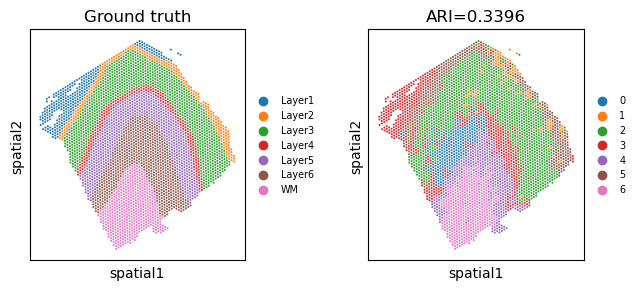

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


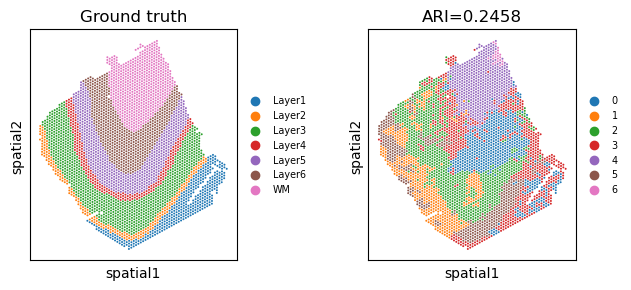

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


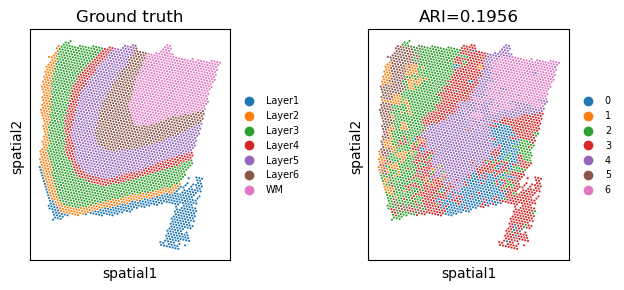

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


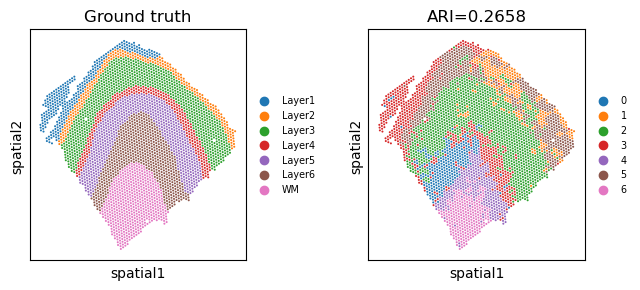

PASTE_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:33<00:00,  6.41it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


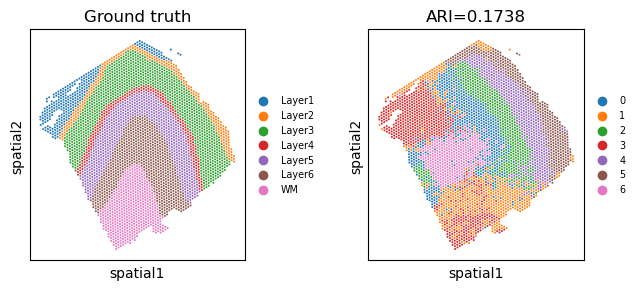

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


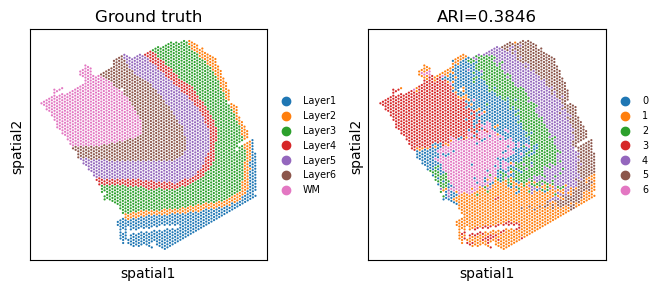

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


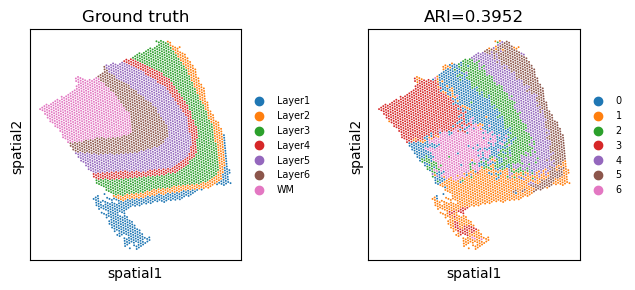

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


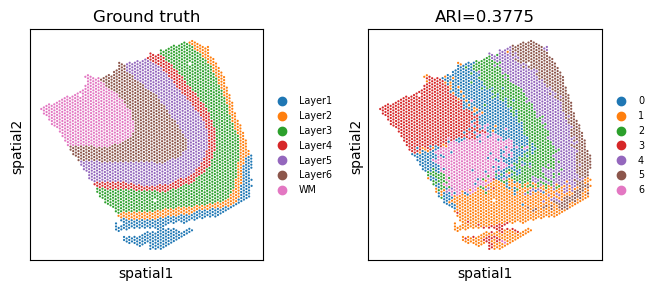

PASTE_p0_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:30<00:00,  3.99it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


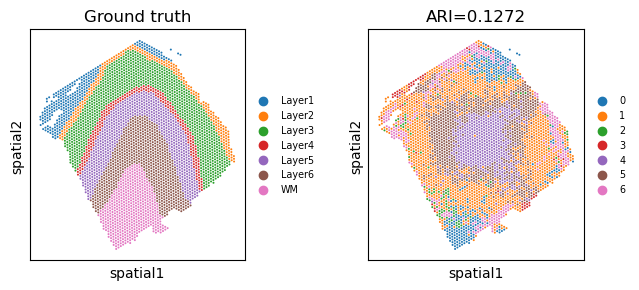

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


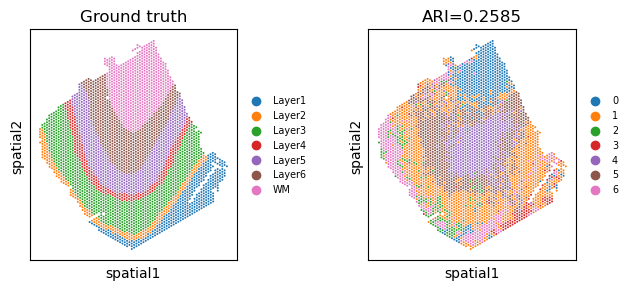

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


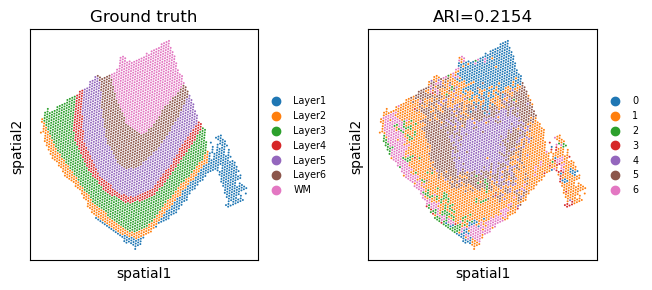

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


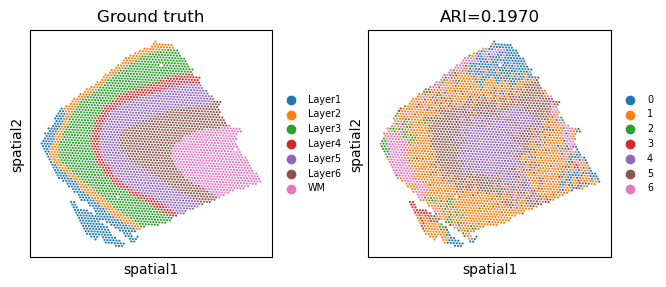

PASTE2_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:02<00:00,  4.91it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


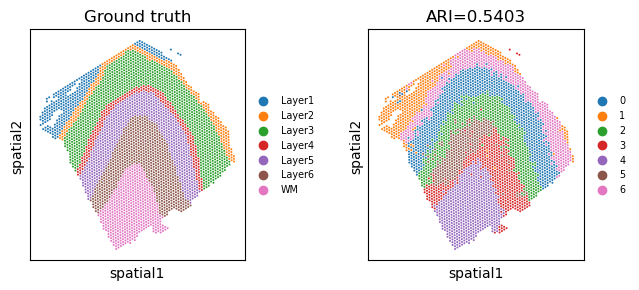

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


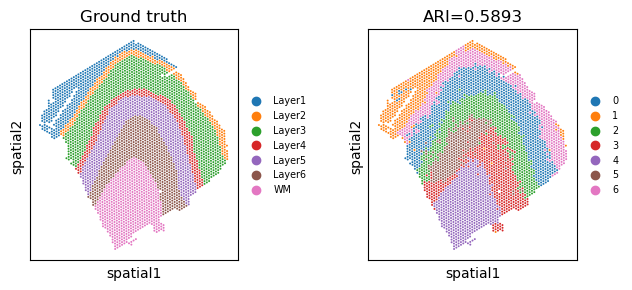

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


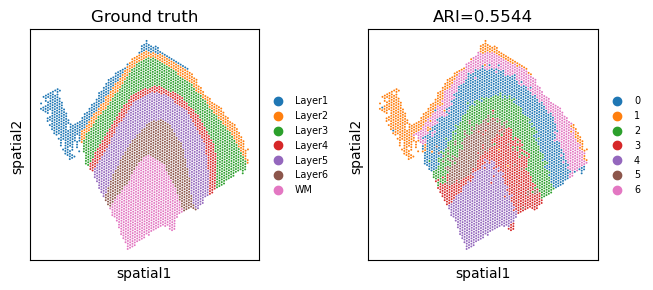

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


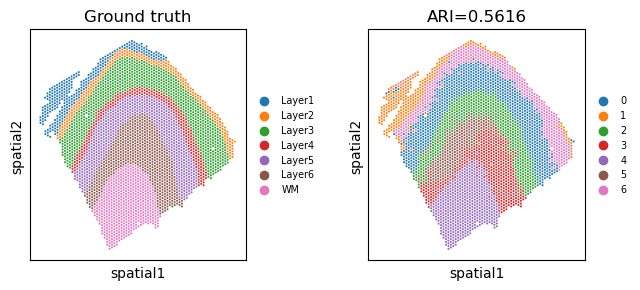

STAligner_DLPFCS_landmark0


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:33<00:00,  6.41it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


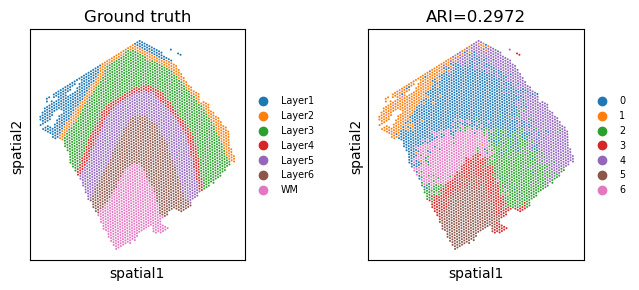

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


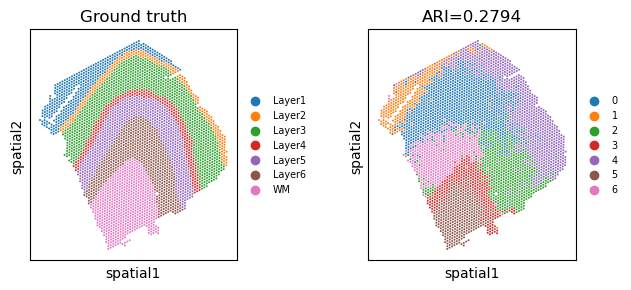

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


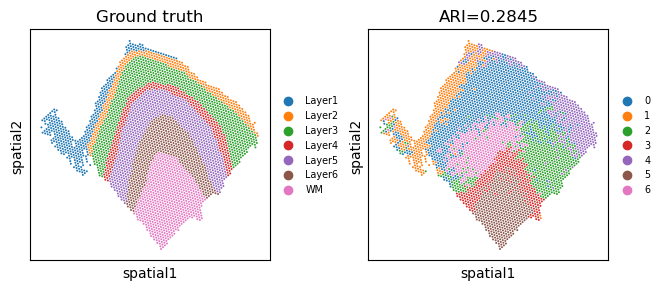

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


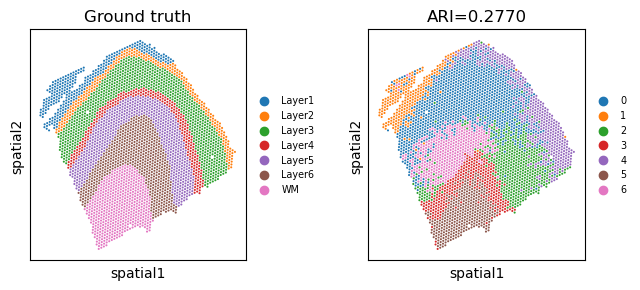

STAligner_DLPFCS_landmark1


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:33<00:00,  3.90it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


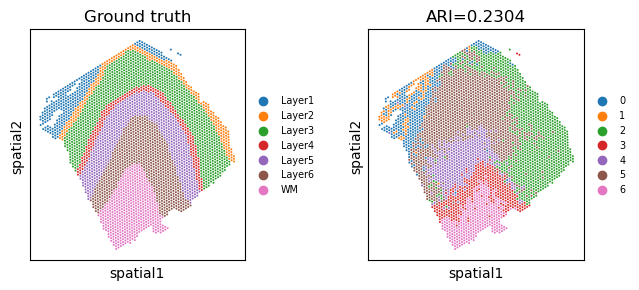

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


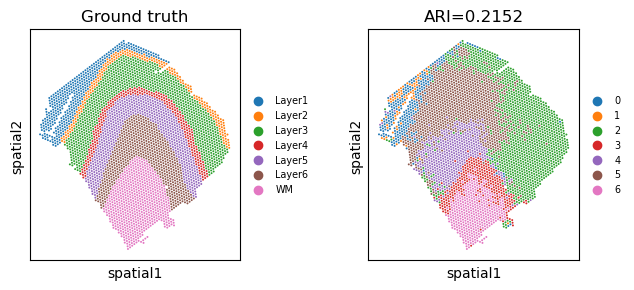

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


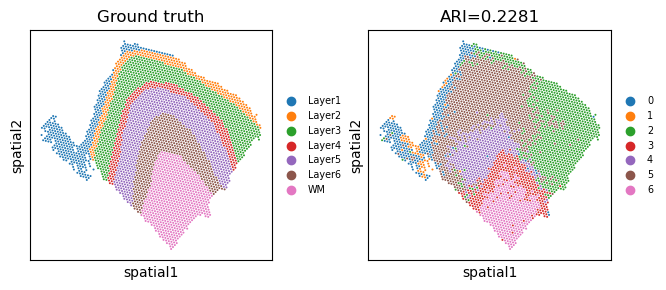

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


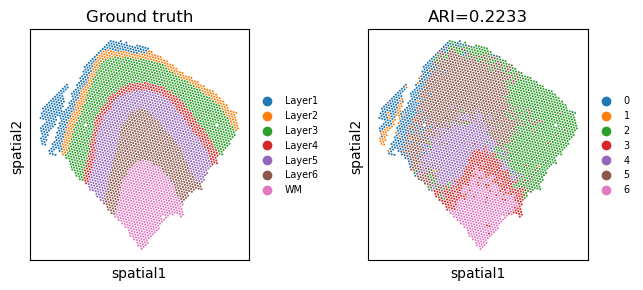

STAligner_DLPFCS_landmark2


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:28<00:00,  4.04it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


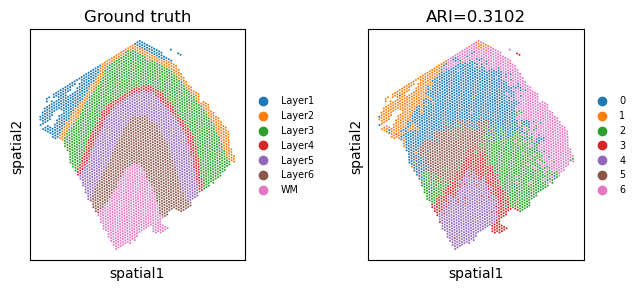

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


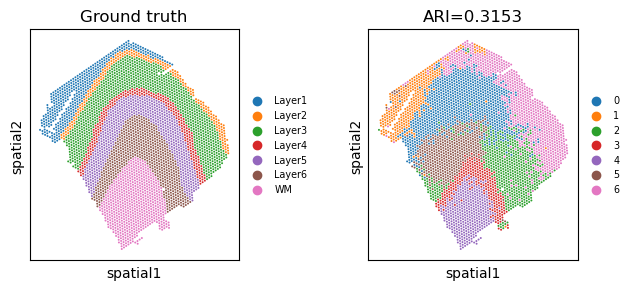

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


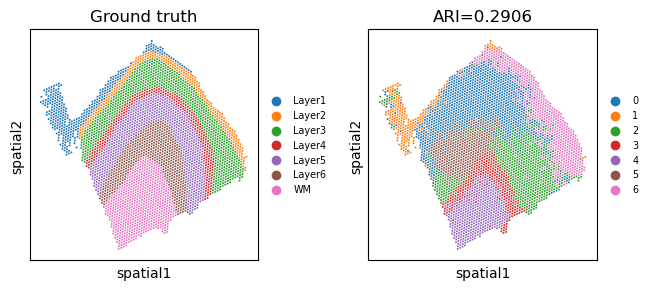

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


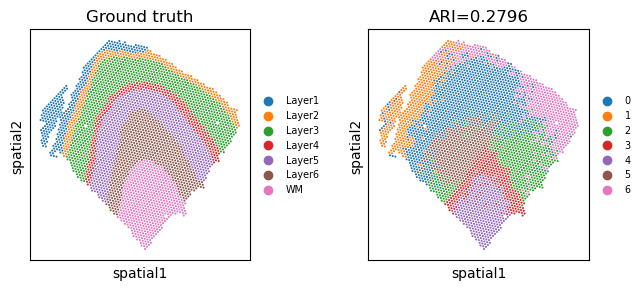

STAligner_DLPFCS_landmark3


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:33<00:00,  6.43it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


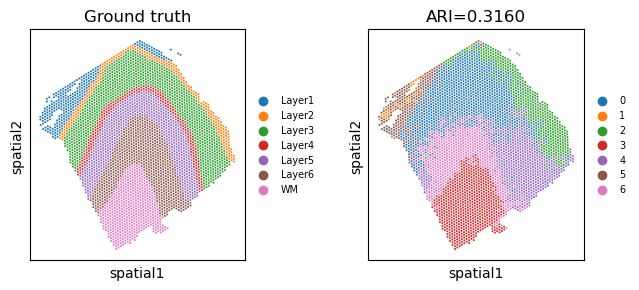

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


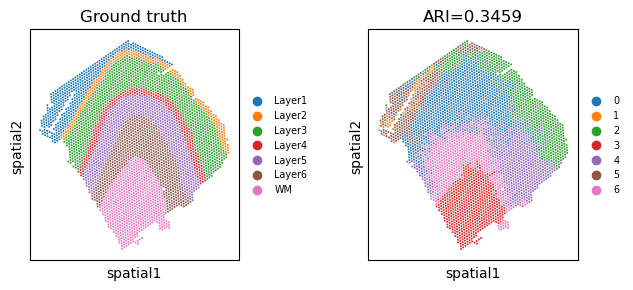

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


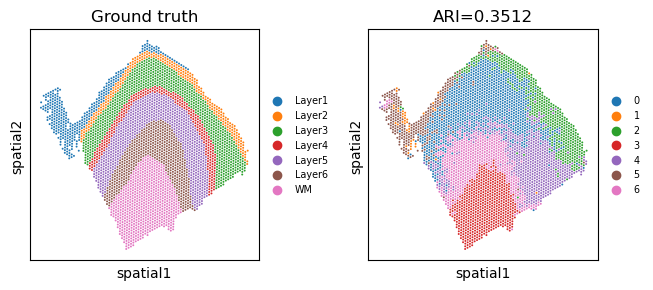

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


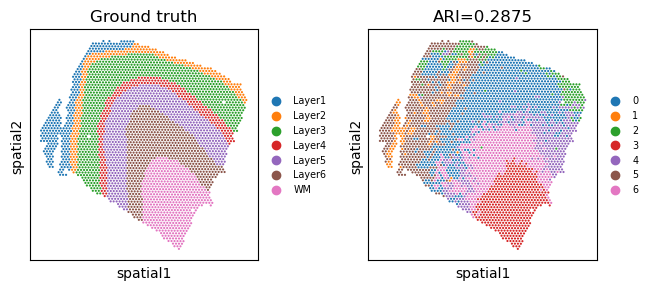

SLAT_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:15<00:00,  4.42it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


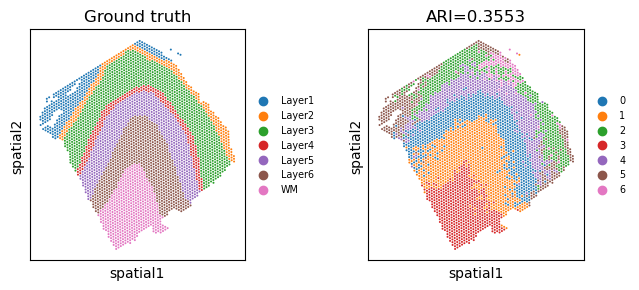

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


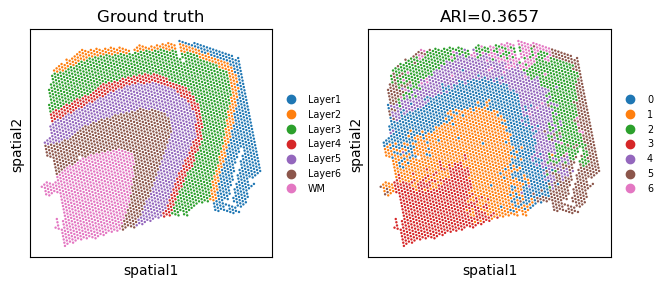

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


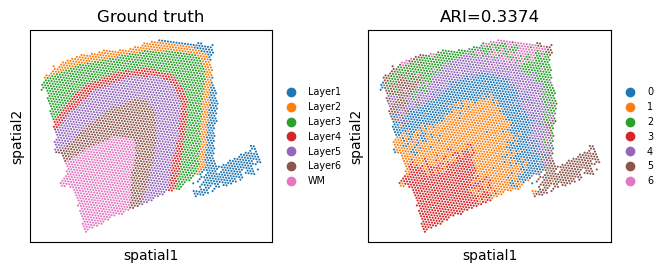

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


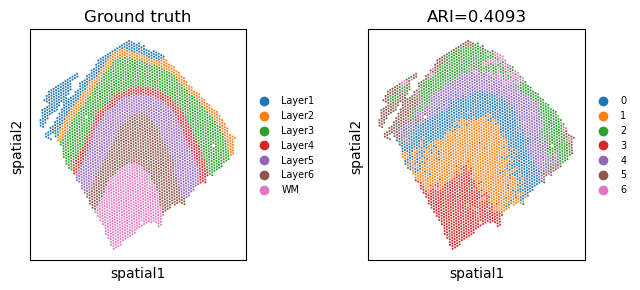

STalign_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:32<00:00,  6.48it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


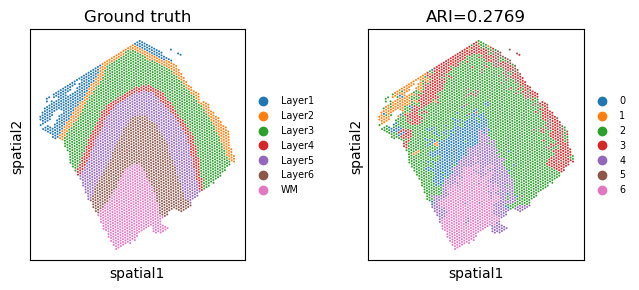

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


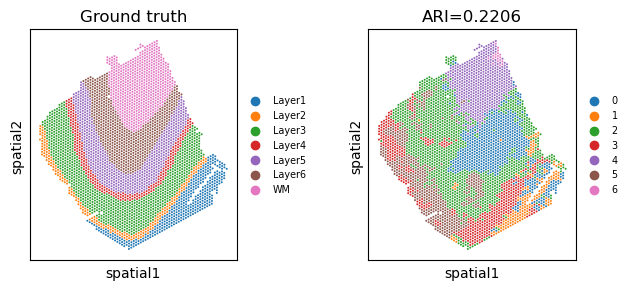

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


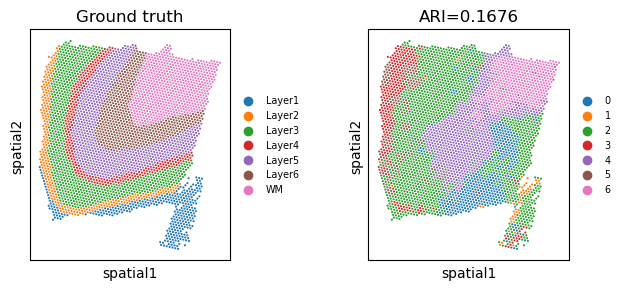

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


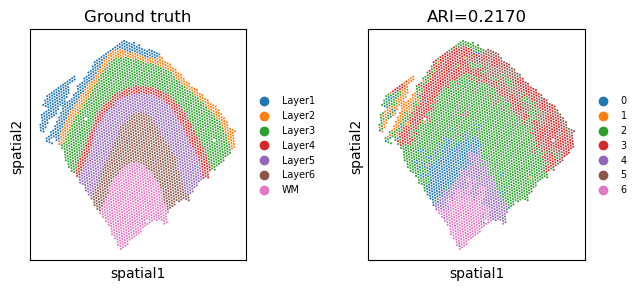

CAST_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:41<00:00,  5.91it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


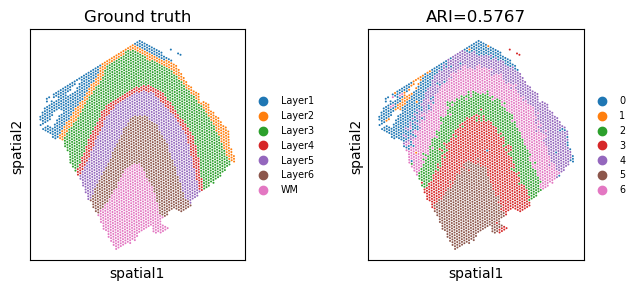

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


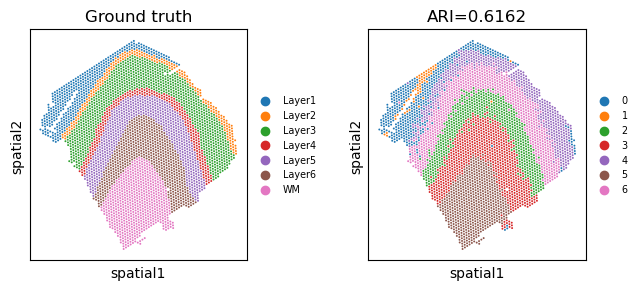

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


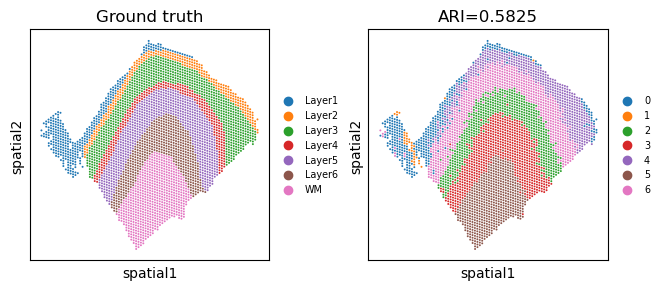

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


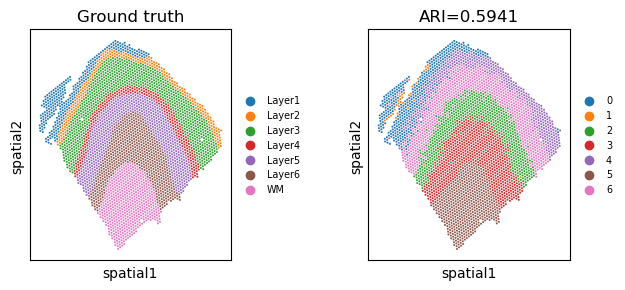

STAIR_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:40<00:00,  3.74it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


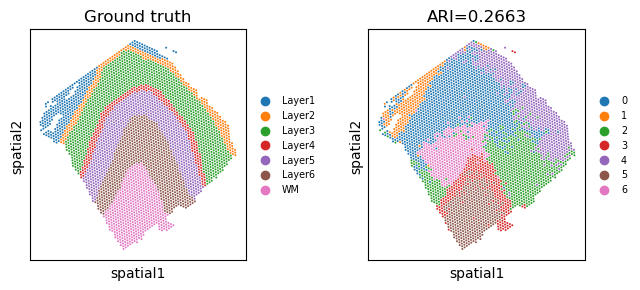

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


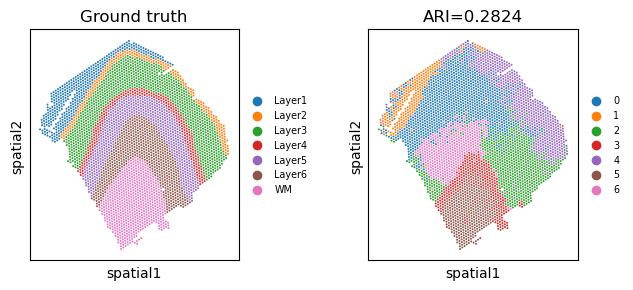

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


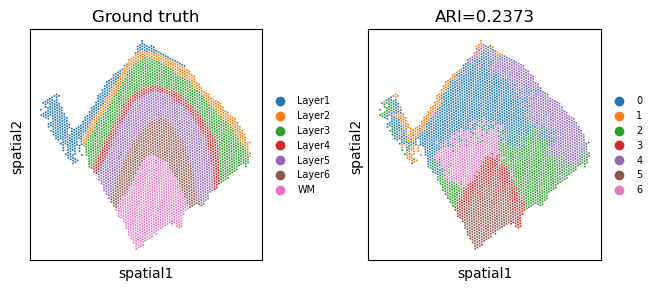

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


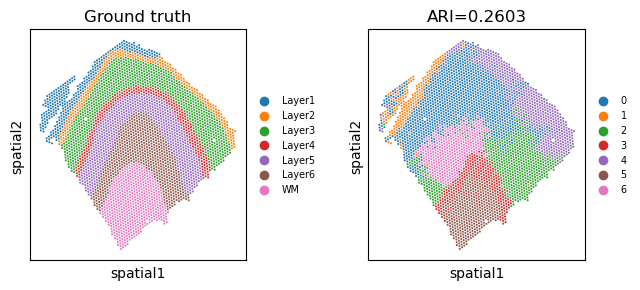

SPACEL_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:57<00:00,  5.09it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


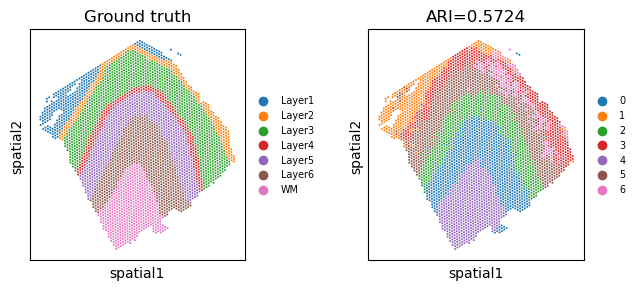

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


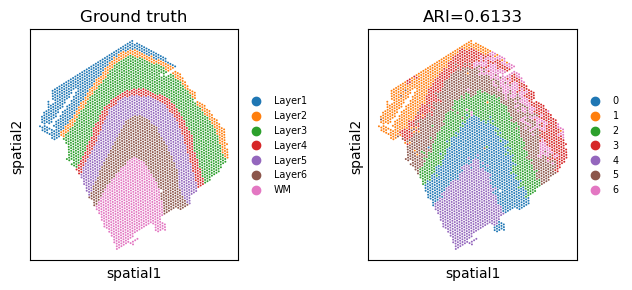

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


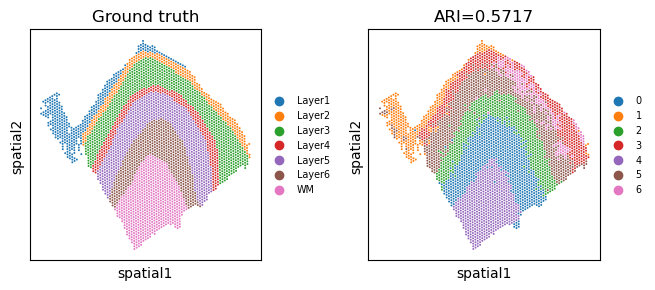

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


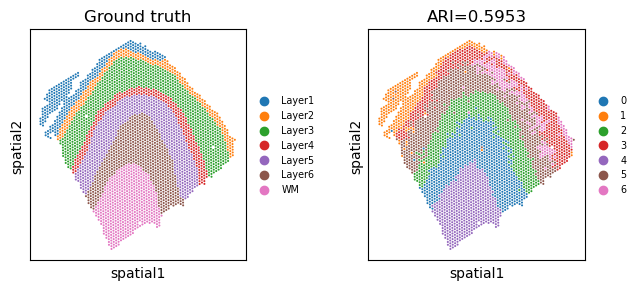

Spateo_rigid_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:33<00:00,  6.41it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


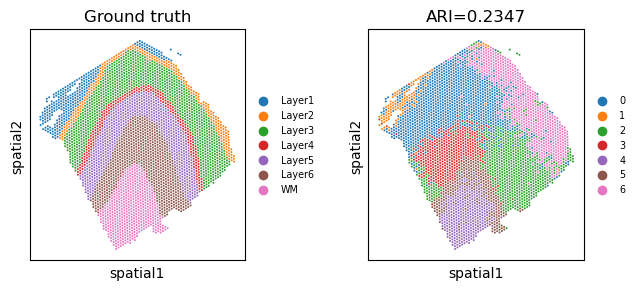

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


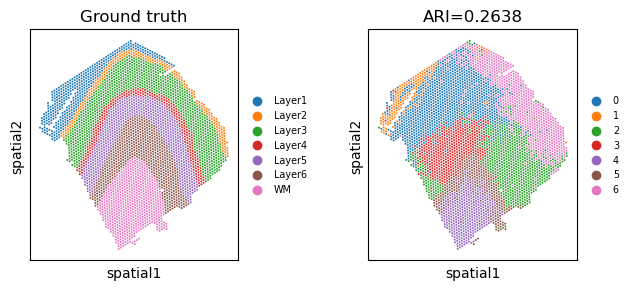

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


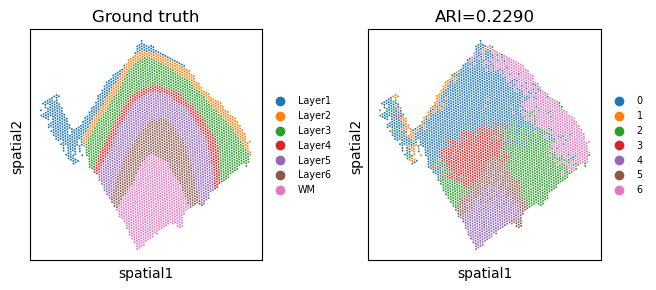

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


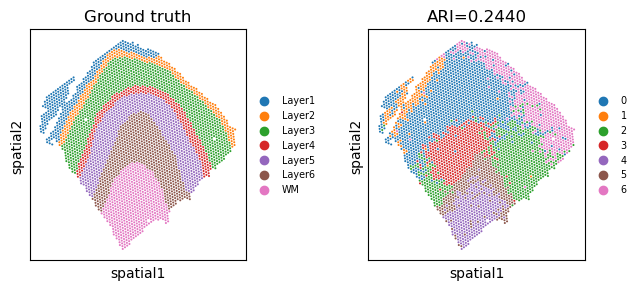

Spateo_nonrigid_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:42<00:00,  3.69it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


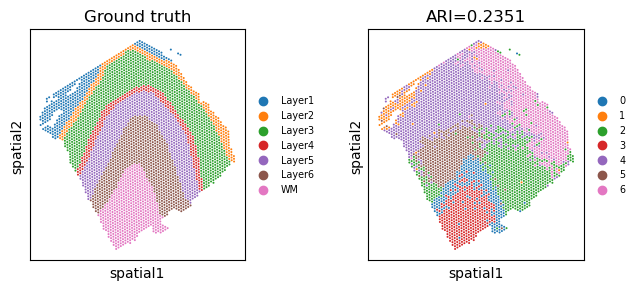

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


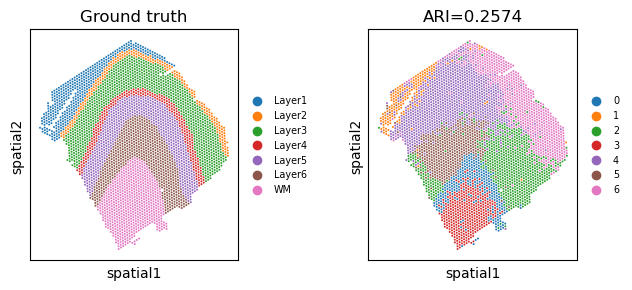

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


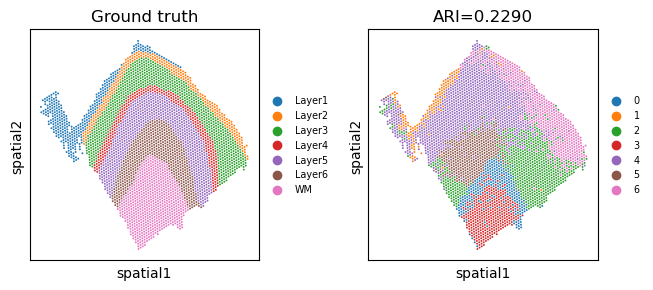

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


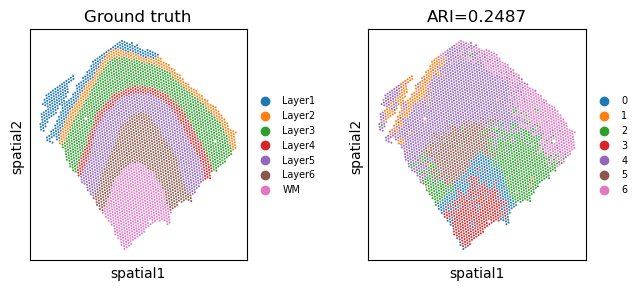

SANTO_DLPFCS


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Begin to train ST data...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [01:33<00:00,  6.44it/s]


Optimization finished for ST data!
fitting ...
  |======================================================================| 100%
Slice 151673 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


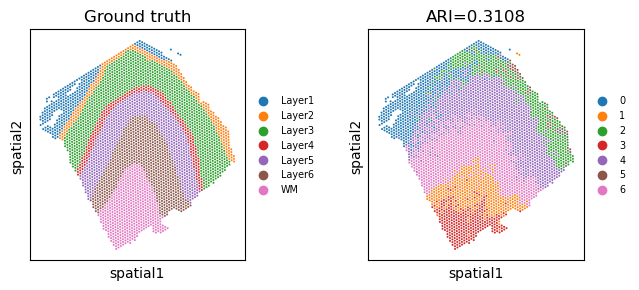

Slice 151674 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


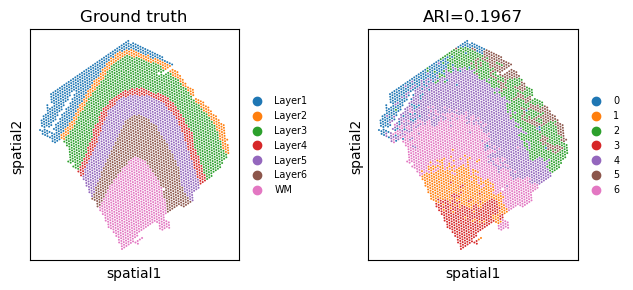

Slice 151675 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


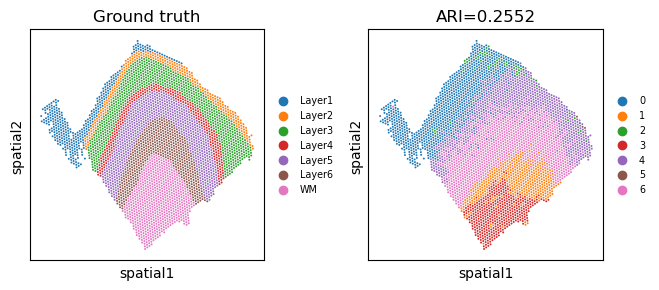

Slice 151676 spatial domain detection result:


/home/yyz/anaconda3/envs/GraphST/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


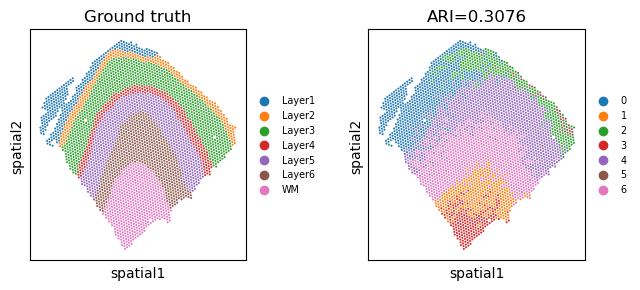

In [14]:
results = {
    "ARI": [],
    "NMI": [],
    "HOM": [],
    "COM": []
}

for i,adatas in enumerate(groups):
    print(groups_names[i])
    ARI_list, NMI_list, HOM_list, COM_list = RunGraphST(adatas, slice_names)
    results["ARI"].append(ARI_list)
    results["NMI"].append(NMI_list)
    results["HOM"].append(HOM_list)
    results["COM"].append(COM_list)

for metric in results:
    df = pd.DataFrame(results[metric], index=groups_names)
    df.to_csv(f"/SABench/DownstreamTasks/DLPFC_3D_Spatial_Clustering_metrics/{metric}.csv", index=True, header=False) 